In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
uploaded=files.upload()
df=pd.read_csv('/content/samplebankloandata.csv')

Saving samplebankloandata.csv to samplebankloandata.csv


In [ ]:
print(df.head())
print(df.tail())
print(df.isnull().sum())

        id  year     issue_d  final_d  emp_length_int home_ownership  \
0  1077501  2011  12-01-2011  1012015            10.0           RENT   
1  1077430  2011  12-01-2011  1042013             0.5           RENT   
2  1077175  2011  12-01-2011  1062014            10.0           RENT   
3  1076863  2011  12-01-2011  1012015            10.0           RENT   
4  1075358  2011  12-01-2011  1012016             1.0           RENT   

   home_ownership_cat income_category  annual_inc  income_cat  ...  \
0                   1             Low       24000           1  ...   
1                   1             Low       30000           1  ...   
2                   1             Low       12252           1  ...   
3                   1             Low       49200           1  ...   
4                   1             Low       80000           1  ...   

   loan_condition_cat interest_rate  grade grade_cat    dti   total_pymnt  \
0                   0         10.65      B         2  27.65   5861.07

In [ ]:
print(df.dtypes)
print(df.describe())

id                        int64
year                      int64
issue_d                  object
final_d                   int64
emp_length_int          float64
home_ownership           object
home_ownership_cat        int64
income_category          object
annual_inc                int64
income_cat                int64
loan_amount               int64
term                     object
term_cat                  int64
application_type         object
application_type_cat      int64
purpose                  object
purpose_cat               int64
interest_payments        object
interest_payment_cat      int64
loan_condition           object
loan_condition_cat        int64
interest_rate           float64
grade                    object
grade_cat                 int64
dti                     float64
total_pymnt             float64
total_rec_prncp         float64
recoveries              float64
installment             float64
region                   object
dtype: object
                 id       

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30437 entries, 0 to 30436
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    30437 non-null  int64  
 1   year                  30437 non-null  int64  
 2   issue_d               30437 non-null  object 
 3   final_d               30437 non-null  int64  
 4   emp_length_int        30437 non-null  float64
 5   home_ownership        30437 non-null  object 
 6   home_ownership_cat    30437 non-null  int64  
 7   income_category       30437 non-null  object 
 8   annual_inc            30437 non-null  int64  
 9   income_cat            30437 non-null  int64  
 10  loan_amount           30437 non-null  int64  
 11  term                  30437 non-null  object 
 12  term_cat              30437 non-null  int64  
 13  application_type      30437 non-null  object 
 14  application_type_cat  30437 non-null  int64  
 15  purpose            

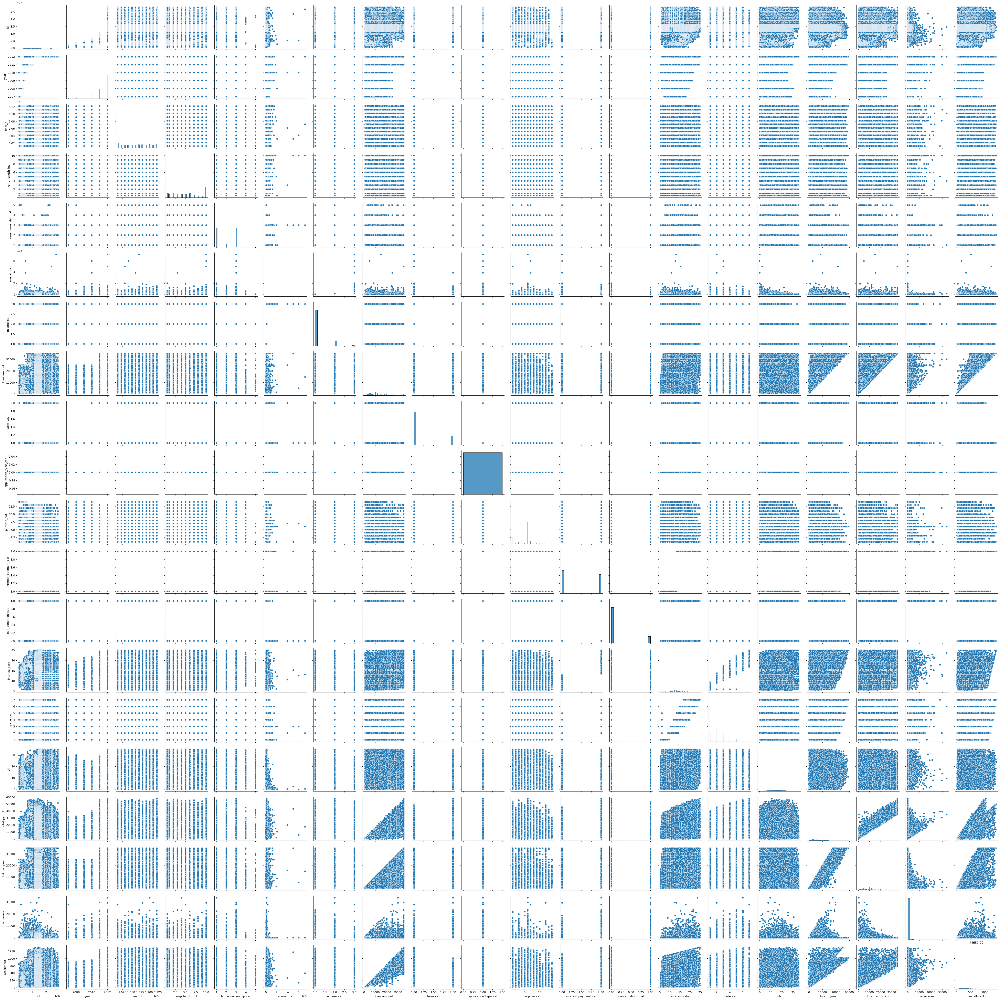

In [6]:
sns.pairplot(df)
plt.title('Pairplot')
plt.show()

In [13]:
#Before we do EDA, lets separate Numerical and categorical variables for easy analysis

cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['issue_d', 'home_ownership', 'income_category', 'term',
       'application_type', 'purpose', 'interest_payments', 'loan_condition',
       'grade', 'region'],
      dtype='object')
Numerical Variables:
['id', 'year', 'final_d', 'emp_length_int', 'home_ownership_cat', 'annual_inc', 'income_cat', 'loan_amount', 'term_cat', 'application_type_cat', 'purpose_cat', 'interest_payment_cat', 'loan_condition_cat', 'interest_rate', 'grade_cat', 'dti', 'total_pymnt', 'total_rec_prncp', 'recoveries', 'installment']


id
Skew : 0.48


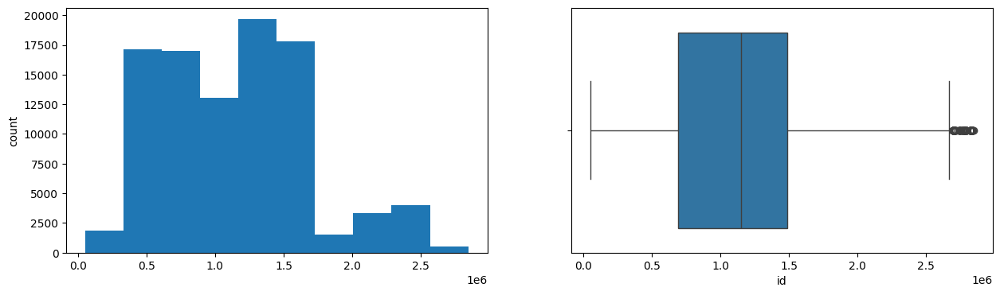

year
Skew : -1.45


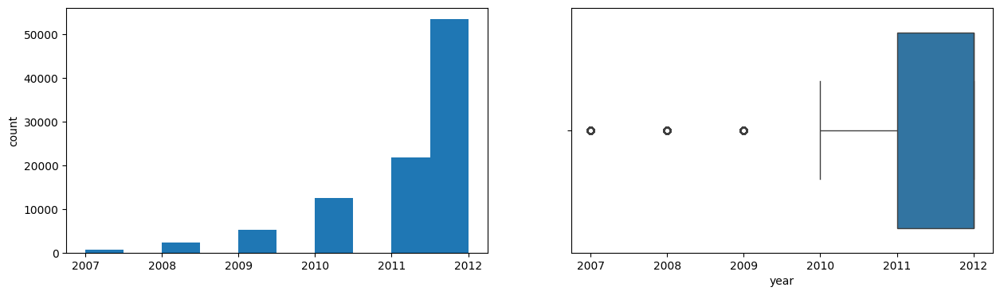

final_d
Skew : -0.03


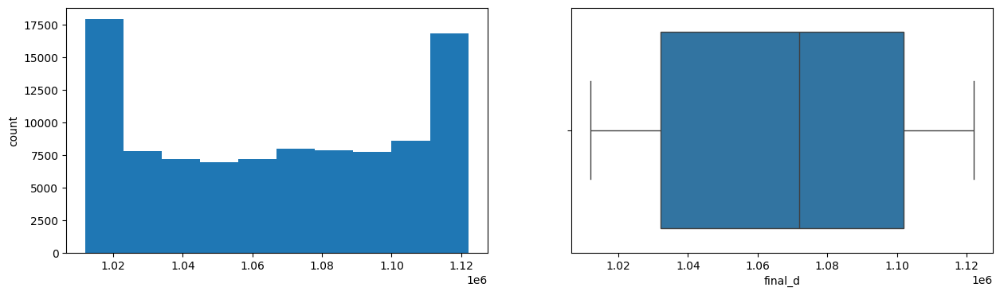

emp_length_int
Skew : 0.06


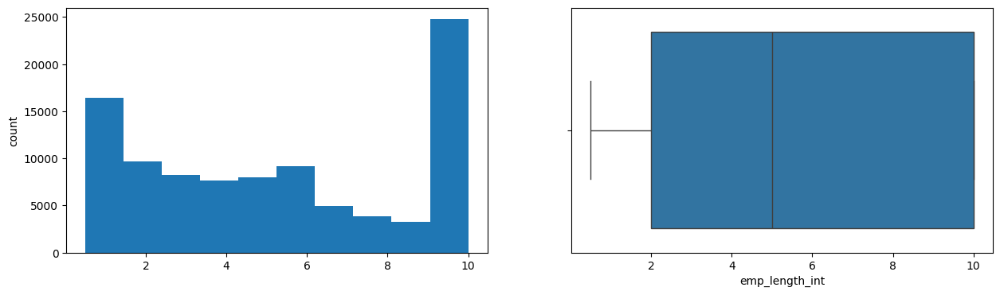

home_ownership_cat
Skew : 0.02


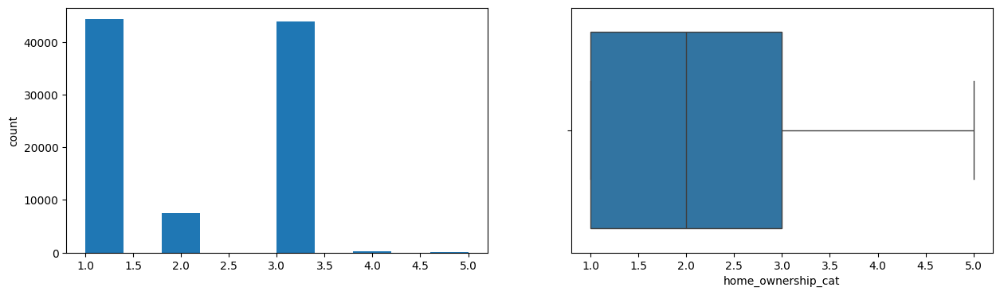

annual_inc
Skew : 37.74


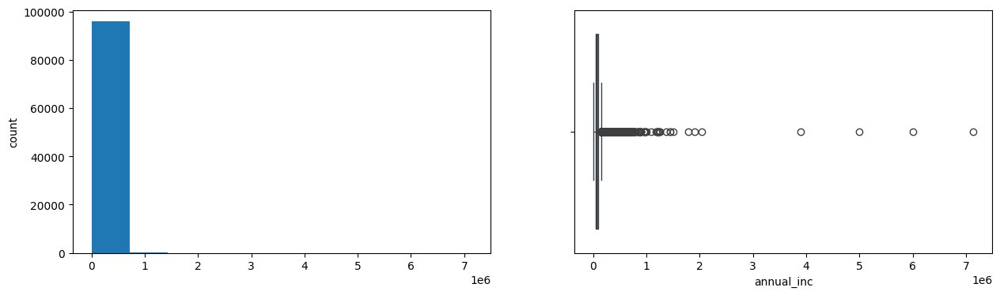

income_cat
Skew : 2.52


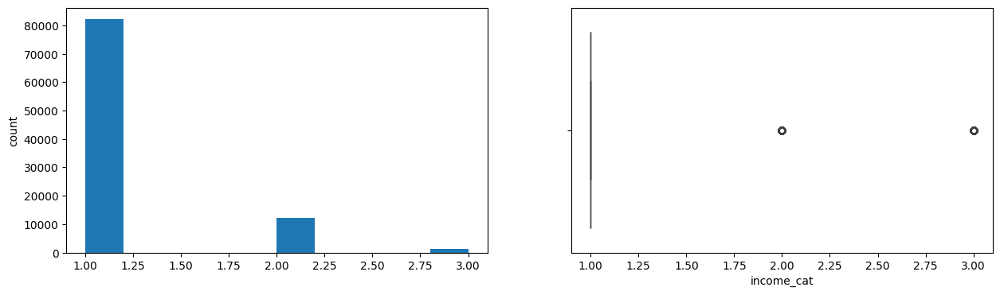

loan_amount
Skew : 0.93


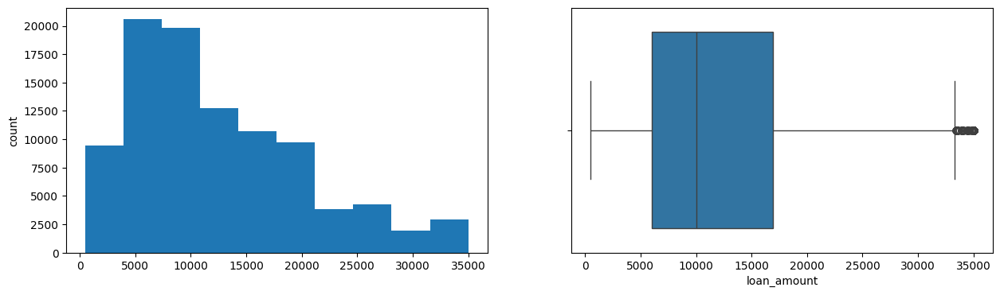

term_cat
Skew : 1.37


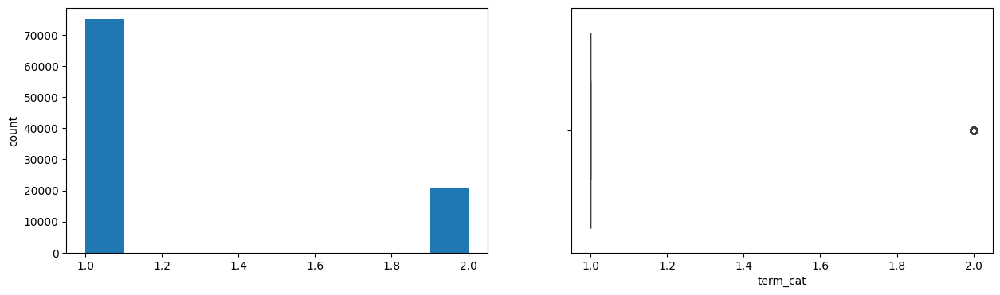

application_type_cat
Skew : 0


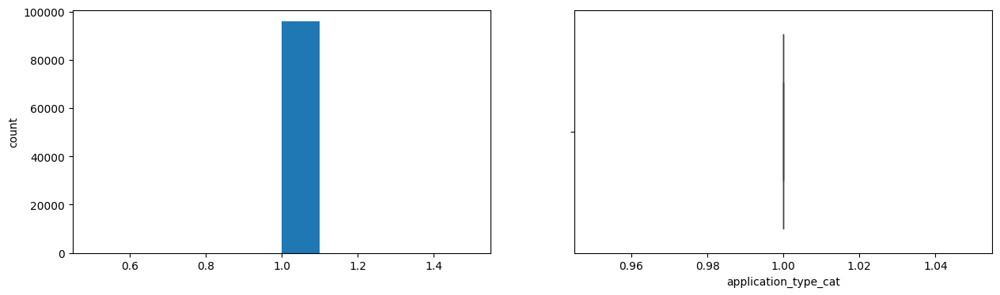

purpose_cat
Skew : -0.08


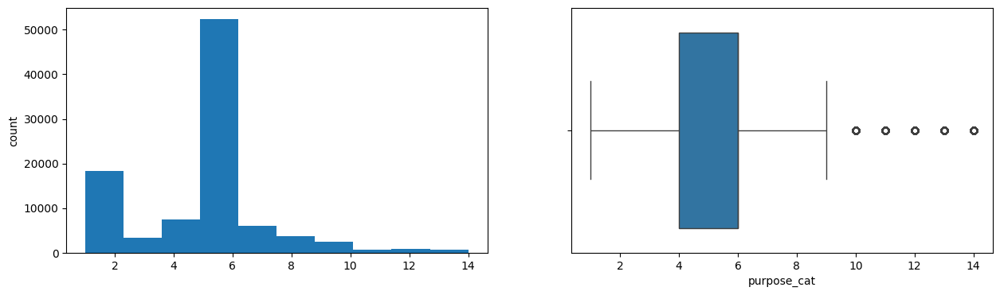

interest_payment_cat
Skew : 0.19


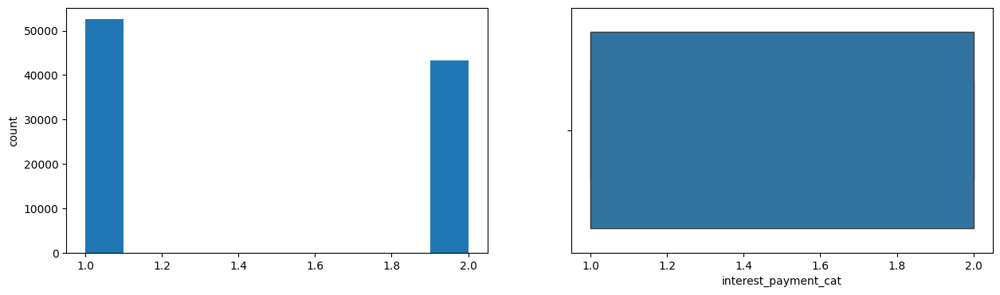

loan_condition_cat
Skew : 1.9


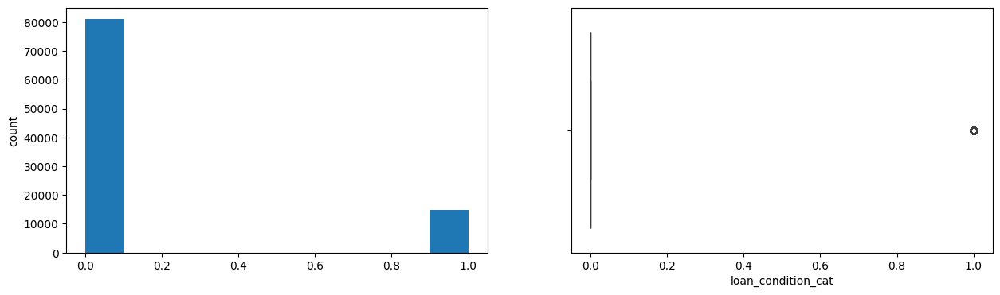

interest_rate
Skew : 0.3


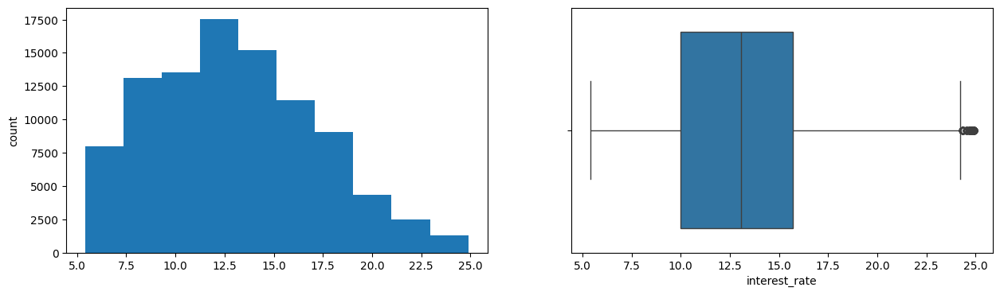

grade_cat
Skew : 0.78


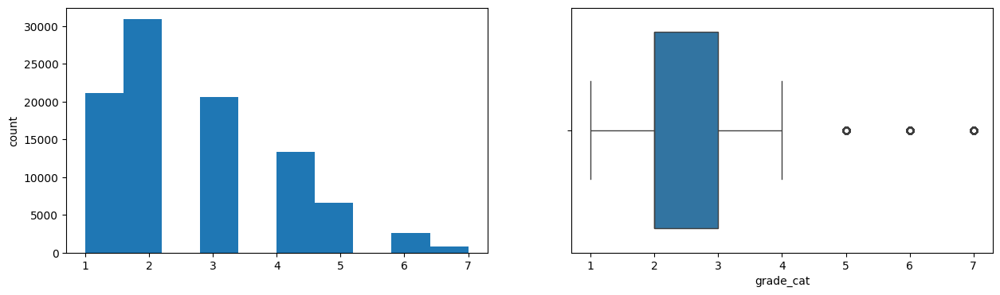

dti
Skew : 0.13


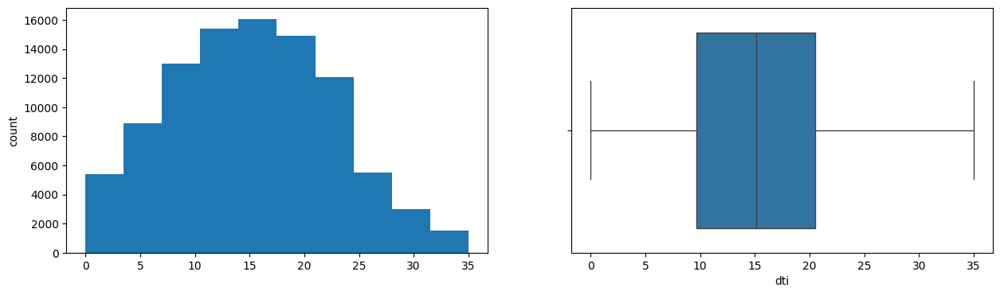

total_pymnt
Skew : 1.18


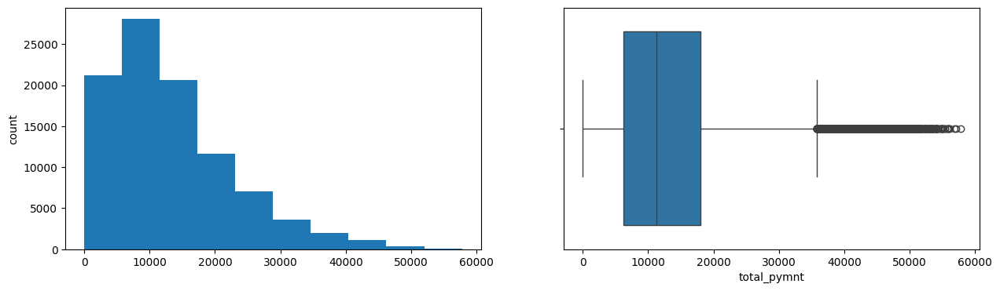

total_rec_prncp
Skew : 1.08


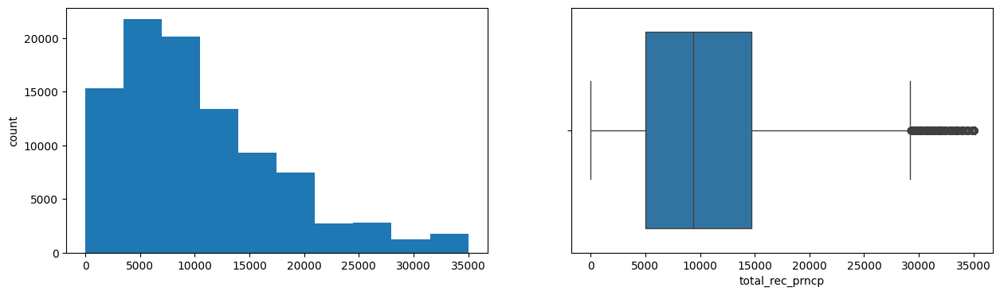

recoveries
Skew : 14.88


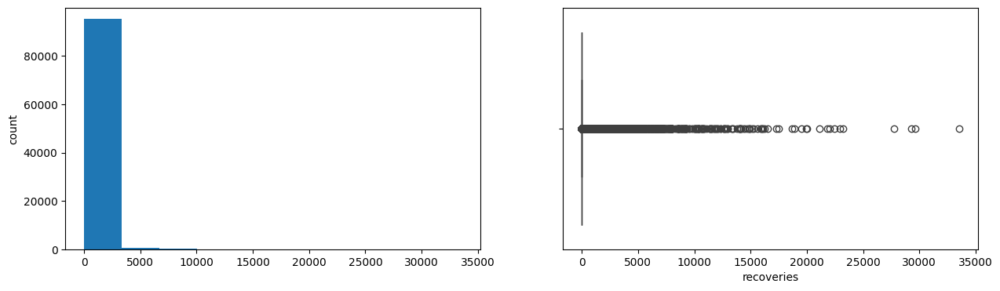

installment
Skew : 1.06


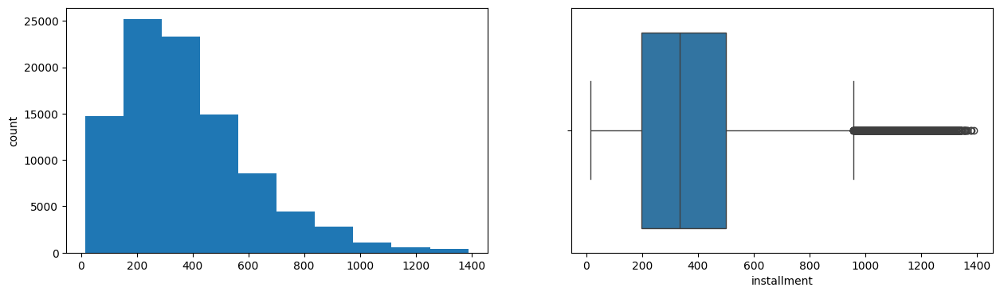

In [14]:
#univariate Analysis
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()

<ipython-input-10-1c49dca0c177>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns_plot = sns.distplot(df["loan_amount"])


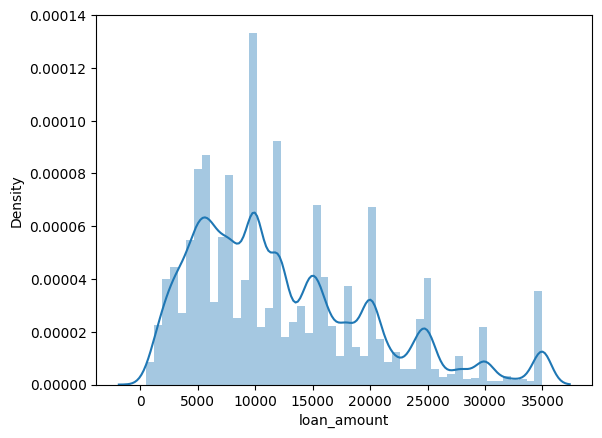

In [10]:
sns_plot = sns.distplot(df["loan_amount"])

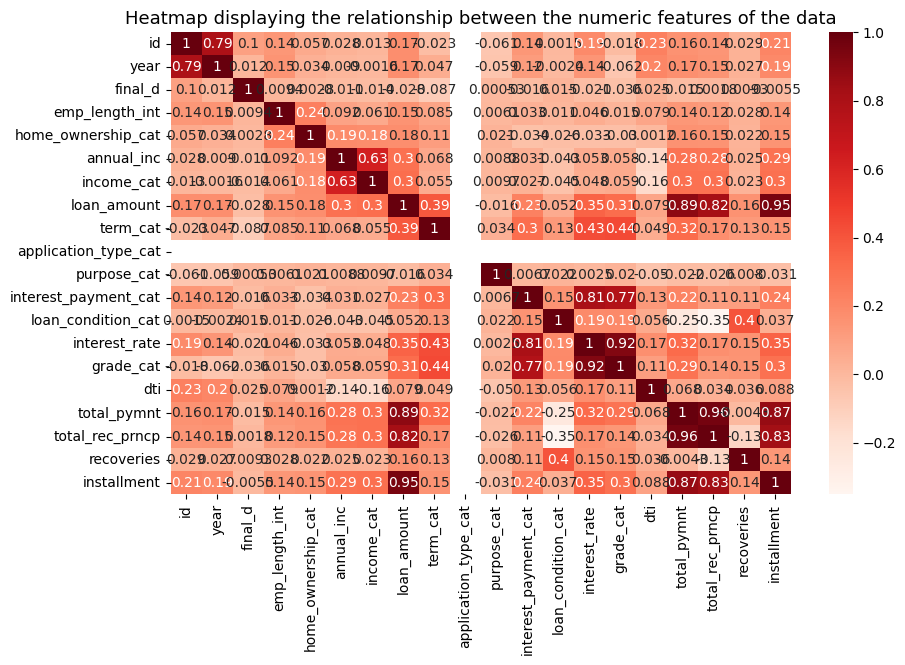

In [9]:
# Drop non-numeric columns or columns that you're not interested in
numeric_df = df.select_dtypes(include='number')

# Create the correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_df.corr(), cmap=plt.cm.Reds, annot=True)
plt.title('Heatmap displaying the relationship between the numeric features of the data', fontsize=13)
plt.show()


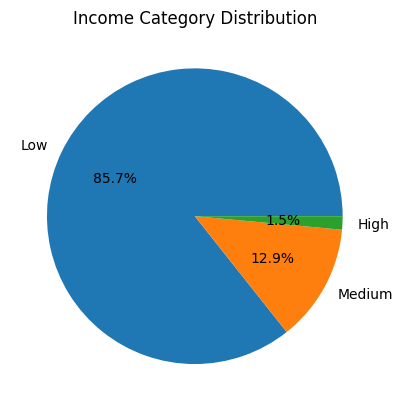

In [17]:
plt.pie(df['income_category'].value_counts(),labels=df['income_category'].value_counts().index,autopct='%1.1f%%')
plt.title('Income Category Distribution')
plt.show()

In [18]:
import plotly.express as px
fig = px.scatter_3d(df, x='annual_inc', y='loan_amount', z='term',color='application_type')
fig.update_layout(scene = dict(
                    xaxis = dict(title  = 'Annual Income'),
                    yaxis = dict(title  = 'Loan Amount'),
                    zaxis = dict(title  = 'Term')))
fig.show()

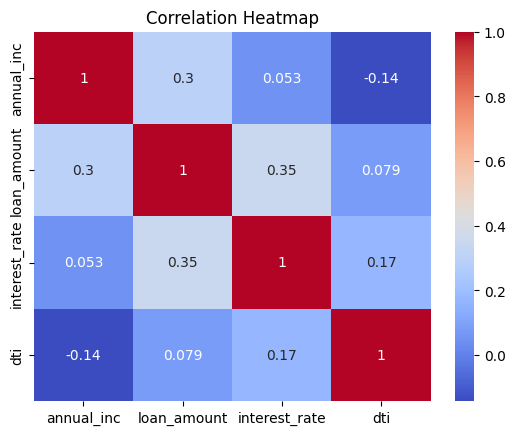

In [19]:
# Subset the DataFrame with the variables of interest
variables_of_interest = ['annual_inc', 'loan_amount', 'interest_rate', 'dti']
subset_df = df[variables_of_interest]

# Calculate the correlation matrix
corr = subset_df.corr()

# Create the heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()